# Semantic segmentation

## Librairies

In [1]:
from pathlib import Path
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from os import listdir
from random import randint
from sklearn.model_selection import train_test_split
from time import time
from copy import deepcopy
from torch import nn

import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [ ]:
# !pip install segmentation_models
# !pip install keras==2.3.1
# !pip install tensorflow==2.1.0
# !pip install keras_applications==1.0.8
# !pip install image-classifiers==1.0.0
# !pip install efficientnet==1.0.0

In [2]:
%env SM_FRAMEWORK=tf.keras

env: SM_FRAMEWORK=tf.keras


In [3]:
#import keras
import tensorflow as tf
import segmentation_models as sm
#from keras import models
sm.set_framework('tf.keras')
sm.framework()
import glob
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt

Segmentation Models: using `tf.keras` framework.


In [5]:
from pathlib import Path
path = Path.cwd().parent
# Base_Path=path / 'input' / 'breast-ultrasound-images-dataset' / 'Dataset_BUSI_with_GT'
Base_Path = "/media/james/My Passport/Jetson_TX2_CMPE258/Dataset_BUSI_with_GT/"
print(Base_Path)
unique_class=[]
for path in os.listdir(Base_Path):
  unique_class.append(path)

print(unique_class)

/media/james/My Passport/Jetson_TX2_CMPE258/Dataset_BUSI_with_GT/
['benign', 'malignant', 'normal']


In [6]:
class_index=[unique_class[1],unique_class[0],unique_class[2]]
for c in class_index:
  print(c,"-",class_index.index(c))

malignant - 0
benign - 1
normal - 2


In [7]:
images=[]
masks=[]
labels=[]

for folder in os.listdir(Base_Path):
  class_path=os.path.join(Base_Path,folder)
  for img in os.listdir(class_path):
    if '_mask' not in img:
      img_path=os.path.join(class_path,img)
      mask_path=img_path.replace(".png","_mask.png")
      if os.path.exists(mask_path):
        images.append(img_path)
        masks.append(mask_path)
        labels.append(folder) 

In [8]:
input_images_size=256
channel=1

In [9]:
import cv2
import scipy
import scipy.ndimage


def load_image(img_path):
  img=cv2.imread(img_path,0)
  return img

'''def padding(img,msk):

  size=np.max(img.shape)
  size_mask=np.max(msk.shape)

  offset_x=(size-img.shape[0])//2
  offset_y=(size-img.shape[1])//2

  offset_xmsk=(size_mask-msk.shape[0])//2
  offset_ymsk=(size_mask-msk.shape[1])//2

  blank_image=np.zeros((size,size))
  blank_mask=np.zeros((size_mask,size_mask))

  blank_image[offset_x:offset_x+img.shape[0],offset_y:offset_y+img.shape[1]]=img
  blank_mask[offset_xmsk:offset_xmsk+msk.shape[0],offset_ymsk:offset_ymsk+msk.shape[1]]=msk

  return blank_image,blank_mask'''

def resize_mask(mask):
  new_size=np.array([input_images_size,input_images_size])/mask.shape
  mask=scipy.ndimage.interpolation.zoom(mask,new_size)
  return mask

def resize(img):
  img=cv2.resize(img,(input_images_size,input_images_size))
  return img

def preprocess(img):
  img=img/255.0
  return img

def inverse_preprocess(img):
  img=img*255
  return img


def load_data(img_path,msk_path,label):
  img=load_image(img_path)
  msk=load_image(msk_path)
  #img,msk=padding(img,msk)
  label_indx=class_index.index(label)
  msk[msk==255]=1
  msk=msk.astype('uint8')
  img=resize(img)
  msk=resize_mask(msk)
  new_mask=np.zeros((input_images_size,input_images_size,2))
  if label_indx!=0:
    new_mask[:,:,label_indx-1]=msk
  return img,new_mask


def load_batch(images,mask,labels):
  batch_x=[]
  batch_y=[]
  for i,m,l in zip(images,masks,labels):
    img,msk=load_data(i,m,l)
    img=preprocess(img)
    batch_x.append(img)
    batch_y.append(msk)

  return np.array(batch_x),np.array(batch_y)


/tmp/ipykernel_228267/3280900223.py:31: DeprecationWarning: Please use `zoom` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  mask=scipy.ndimage.interpolation.zoom(mask,new_size)


1 255 (256, 256)


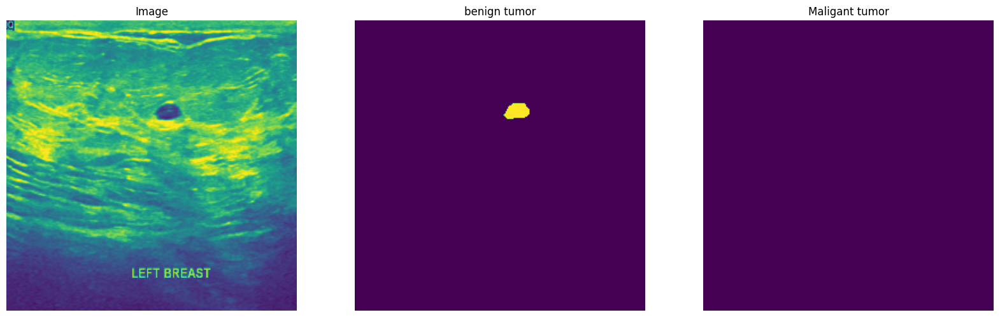

0 255 (256, 256)


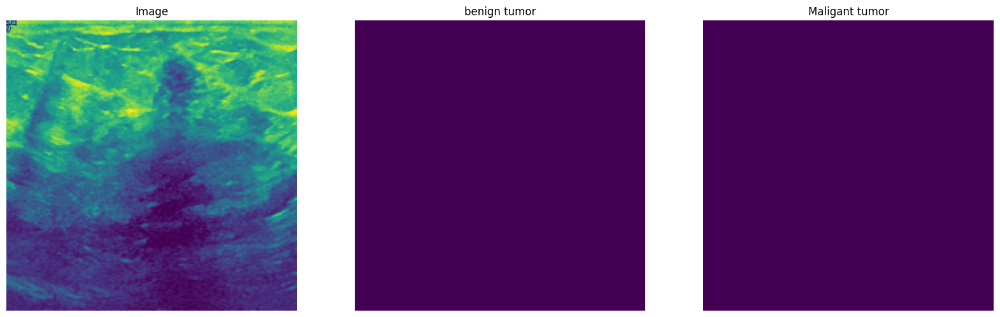

0 241 (256, 256)


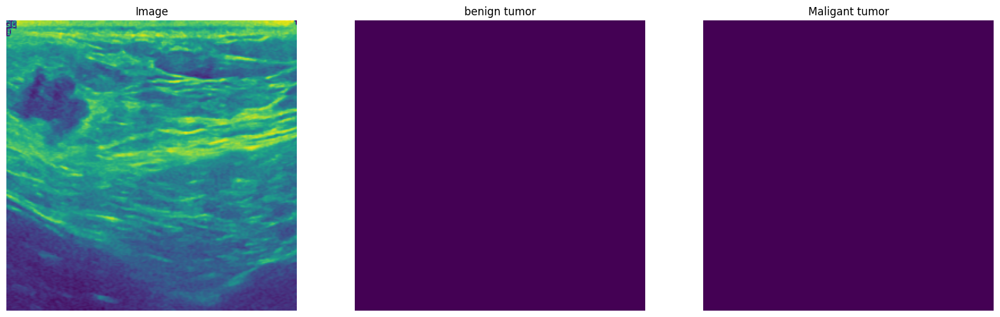

In [10]:
import matplotlib.pyplot as plt


for i in [0,500,600]:
  indx=i
  img,msk=load_data(images[indx],masks[indx],labels[indx])
  print(np.min(img),np.max(img),img.shape)
  plt.figure(figsize=(20,20))
  plt.subplot(1,3,1)
  plt.axis('off')
  plt.imshow(img)
  plt.title("Image")
  plt.subplot(1,3,2)
  plt.axis('off')
  plt.imshow(msk[:,:,0])
  plt.title("benign tumor")
  plt.subplot(1,3,3)
  plt.axis('off')
  plt.imshow(msk[:,:,1])
  plt.title("Maligant tumor")
  plt.show()




In [12]:
images=np.array(images)
masks=np.array(masks)
labels=np.array(labels)

In [13]:
print(tf.__version__)

2.7.1


In [ ]:
# !pip install tensorflow==2.5.0

In [ ]:
#from keras.utils import conv_utils, multi_gpu_model

: 

In [14]:
import tensorflow as tf
import segmentation_models as sm
sm.set_framework('tf.keras')



sm.framework()
BACKBONE='resnet34'
LR=0.00001

model=sm.Linknet(BACKBONE,classes=2,activation='sigmoid',input_shape=(input_images_size,input_images_size,channel),encoder_weights=None)
optim=tf.keras.optimizers.Adam(LR)

dice_loss=sm.losses.DiceLoss()
focal_loss=sm.losses.BinaryFocalLoss()
total_loss=dice_loss+(1*focal_loss)




metrics=[sm.metrics.IOUScore(threshold=0.5),
         sm.metrics.FScore(threshold=0.5)]


model.compile(optim,total_loss,metrics)


2022-11-27 13:08:30.347101: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-27 13:08:30.348180: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-27 13:08:30.348434: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-11-27 13:08:30.348999: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropri

In [15]:
batch_size=4
history={"epoch":[]}
for e in range(100):
  print("epoch:",e,end=">")
  indexes=list(range(len(images)))
  temp_history={'loss':[],
                'IOU':[],
                'F-Score':[]}
  for b in range(0,len(images),batch_size):
    bs=b
    be=bs+batch_size
    batch_index=indexes[bs:be]
    batch_x, batch_y=load_batch(images[batch_index],masks[batch_index],labels[batch_index])
    batch_x=np.expand_dims(batch_x,axis=-1)
    batch_y=np.expand_dims(batch_y,axis=-1)
    batch_y=batch_y.astype("float32")
    loss=model.train_on_batch(batch_x,batch_y)
    temp_history['loss'].append(loss[0])
    temp_history['IOU'].append(loss[1])
    temp_history['F-Score'].append(loss[2])
  
  print("loss",np.round(np.mean(temp_history['loss']),4),
        "IOU",np.round(np.mean(temp_history['IOU']),4),
        "F-score",np.round(np.mean(temp_history['F-Score']),4))
  
  history['epoch'].append("temp_history")



epoch: 0>

/tmp/ipykernel_228267/3280900223.py:31: DeprecationWarning: Please use `zoom` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  mask=scipy.ndimage.interpolation.zoom(mask,new_size)
2022-11-27 13:09:38.272055: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8500


loss 1.2027 IOU 0.0139 F-score 0.0268
epoch: 1>loss 1.1562 IOU 0.0146 F-score 0.028
epoch: 2>loss 1.1183 IOU 0.0161 F-score 0.0307
epoch: 3>loss 1.0894 IOU 0.0175 F-score 0.0333
epoch: 4>loss 1.0682 IOU 0.019 F-score 0.0361
epoch: 5>loss 1.0521 IOU 0.0206 F-score 0.039
epoch: 6>loss 1.0395 IOU 0.0221 F-score 0.0415
epoch: 7>loss 1.0293 IOU 0.0236 F-score 0.0441
epoch: 8>loss 1.0208 IOU 0.0256 F-score 0.0475
epoch: 9>loss 1.0135 IOU 0.0287 F-score 0.0524
epoch: 10>loss 1.0072 IOU 0.0335 F-score 0.0599
epoch: 11>loss 1.0013 IOU 0.0415 F-score 0.0722
epoch: 12>loss 0.9952 IOU 0.0556 F-score 0.093
epoch: 13>loss 0.9881 IOU 0.082 F-score 0.1293
epoch: 14>loss 0.9789 IOU 0.1221 F-score 0.1793
epoch: 15>loss 0.9675 IOU 0.1654 F-score 0.2249
epoch: 16>loss 0.957 IOU 0.1942 F-score 0.251
epoch: 17>loss 0.9471 IOU 0.2135 F-score 0.2672
epoch: 18>loss 0.9347 IOU 0.2394 F-score 0.2869
epoch: 19>loss 0.9238 IOU 0.2553 F-score 0.2983
epoch: 20>loss 0.9141 IOU 0.2641 F-score 0.3045
epoch: 21>loss 0.9

In [16]:
batch_size=4
history={"epoch":[]}
for e in range(25):
  print("epoch:",e,end=">")
  indexes=list(range(len(images)))
  temp_history={'loss':[],
                'IOU':[],
                'F-Score':[]}
  for b in range(0,len(images),batch_size):
    bs=b
    be=bs+batch_size
    batch_index=indexes[bs:be]
    batch_x, batch_y=load_batch(images[batch_index],masks[batch_index],labels[batch_index])
    batch_x=np.expand_dims(batch_x,axis=-1)
    batch_y=np.expand_dims(batch_y,axis=-1)
    batch_y=batch_y.astype("float32")
    loss=model.train_on_batch(batch_x,batch_y)
    temp_history['loss'].append(loss[0])
    temp_history['IOU'].append(loss[1])
    temp_history['F-Score'].append(loss[2])
  
  print("loss",np.round(np.mean(temp_history['loss']),4),
        "IOU",np.round(np.mean(temp_history['IOU']),4),
        "F-score",np.round(np.mean(temp_history['F-Score']),4))
  
  history['epoch'].append("temp_history")


epoch: 0>

/tmp/ipykernel_228267/3280900223.py:31: DeprecationWarning: Please use `zoom` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  mask=scipy.ndimage.interpolation.zoom(mask,new_size)


loss 0.6446 IOU 0.3819 F-score 0.3895
epoch: 1>loss 0.6446 IOU 0.3714 F-score 0.3791
epoch: 2>loss 0.6443 IOU 0.3767 F-score 0.3842
epoch: 3>loss 0.644 IOU 0.3617 F-score 0.3691
epoch: 4>loss 0.6436 IOU 0.3854 F-score 0.3925
epoch: 5>loss 0.6433 IOU 0.4036 F-score 0.4106
epoch: 6>loss 0.6431 IOU 0.3885 F-score 0.3953
epoch: 7>loss 0.6429 IOU 0.3962 F-score 0.4031
epoch: 8>loss 0.6427 IOU 0.4093 F-score 0.416
epoch: 9>loss 0.6424 IOU 0.3814 F-score 0.388
epoch: 10>loss 0.6425 IOU 0.3961 F-score 0.403
epoch: 11>loss 0.6424 IOU 0.3937 F-score 0.4005
epoch: 12>loss 0.6424 IOU 0.3784 F-score 0.3852
epoch: 13>loss 0.6422 IOU 0.4092 F-score 0.416
epoch: 14>loss 0.6433 IOU 0.3716 F-score 0.379
epoch: 15>loss 0.643 IOU 0.3949 F-score 0.4024
epoch: 16>loss 0.6419 IOU 0.3995 F-score 0.406
epoch: 17>loss 0.6413 IOU 0.4361 F-score 0.4423
epoch: 18>loss 0.6412 IOU 0.4261 F-score 0.4321
epoch: 19>loss 0.641 IOU 0.4443 F-score 0.4502
epoch: 20>loss 0.6407 IOU 0.465 F-score 0.4708
epoch: 21>loss 0.6405

In [17]:
# model.save('/kaggle/working/Linknet_model.h5')

model.save('Linknet_model_asusrog.h5')

/home/james/miniconda3/envs/cmpe258_proj_rasa_tf_gpu/lib/python3.9/site-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


In [18]:
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm
import keras
from keras import backend as K
from keras import activations, initializers, regularizers, constraints, metrics
from keras.datasets import cifar10
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, Model
from keras.layers import (Dense, Dropout, Activation, Flatten, Reshape, Layer,
                          BatchNormalization, LocallyConnected2D,
                          ZeroPadding2D, Conv2D, MaxPooling2D, Conv2DTranspose,
                          GaussianNoise, UpSampling2D, Input)
#from keras.utils import conv_utils, multi_gpu_model
from keras.layers import Lambda
from keras.engine import Layer, InputSpec
from keras.legacy import interfaces

ImportError: cannot import name 'Layer' from 'keras.engine' (/home/james/miniconda3/envs/cmpe258_proj_rasa_tf_gpu/lib/python3.9/site-packages/keras/engine/__init__.py)

/tmp/ipykernel_228267/3280900223.py:31: DeprecationWarning: Please use `zoom` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  mask=scipy.ndimage.interpolation.zoom(mask,new_size)


0 255 (256, 256)


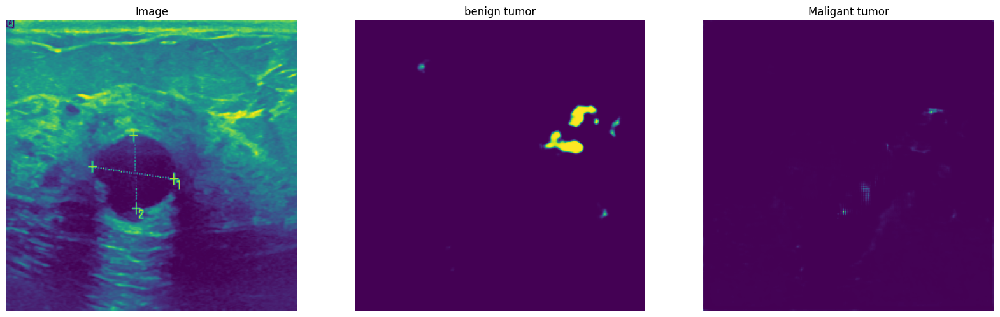

0 255 (256, 256)


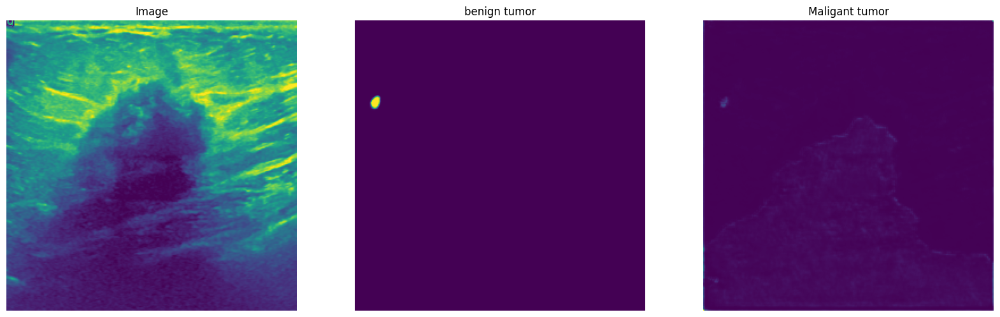

0 251 (256, 256)


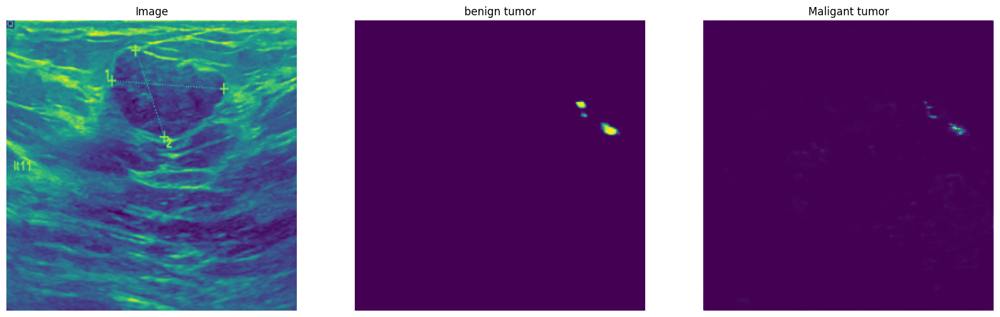

0 255 (256, 256)


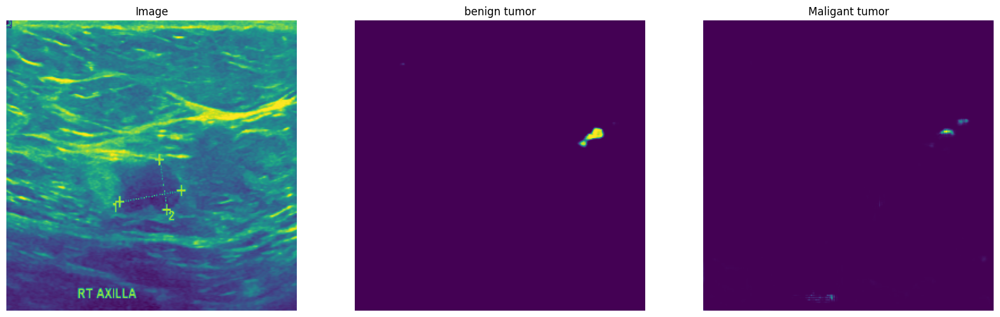

0 250 (256, 256)


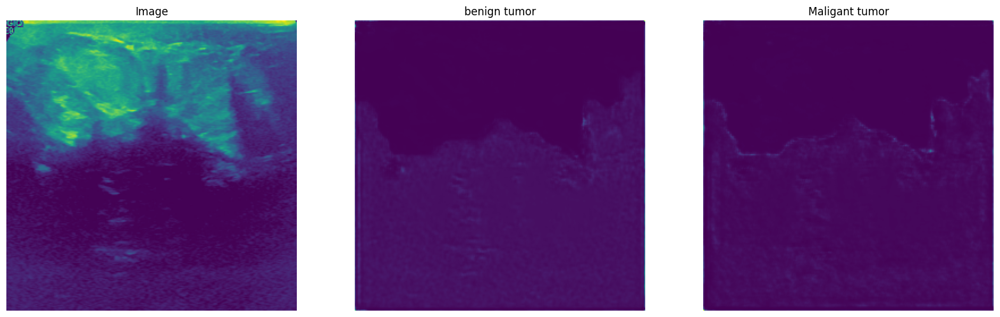

0 237 (256, 256)


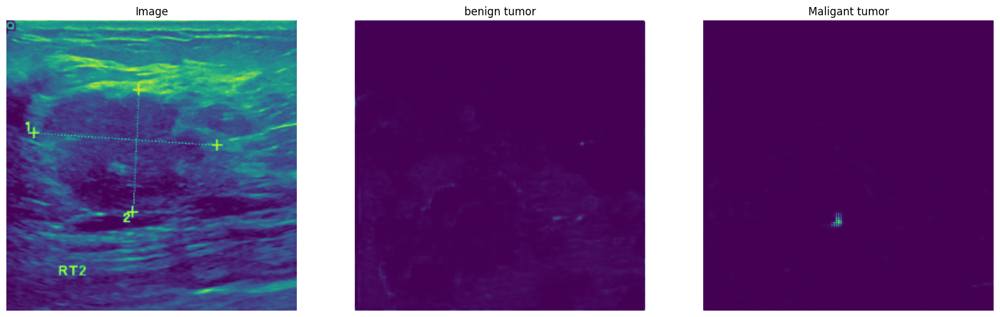

0 255 (256, 256)


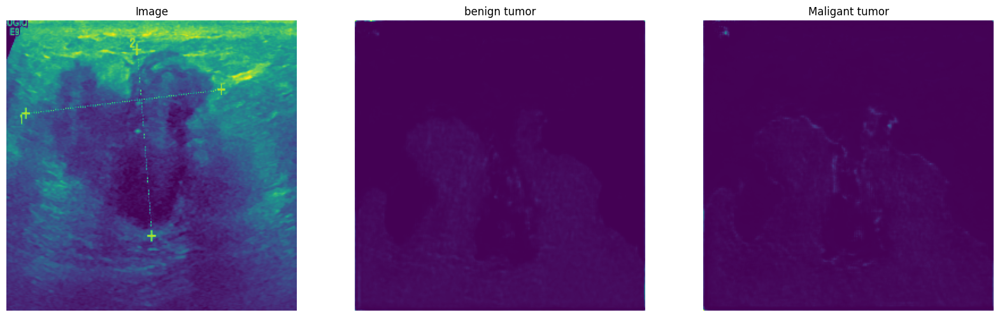

1 233 (256, 256)


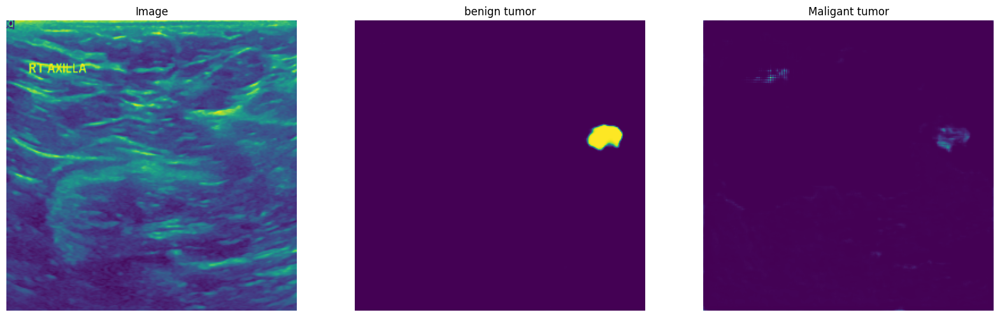

0 230 (256, 256)


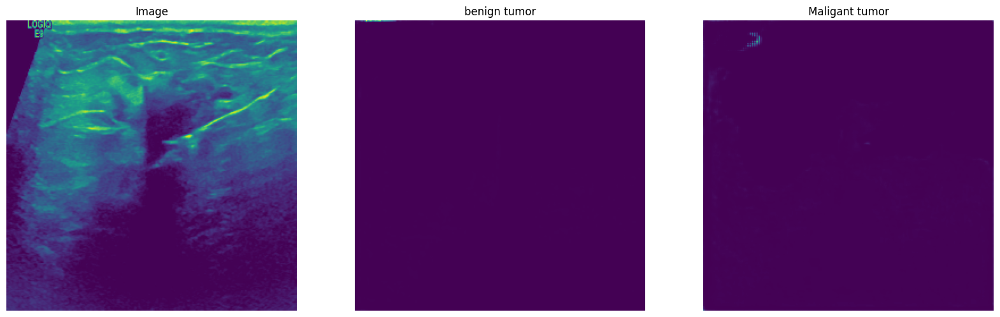

0 255 (256, 256)


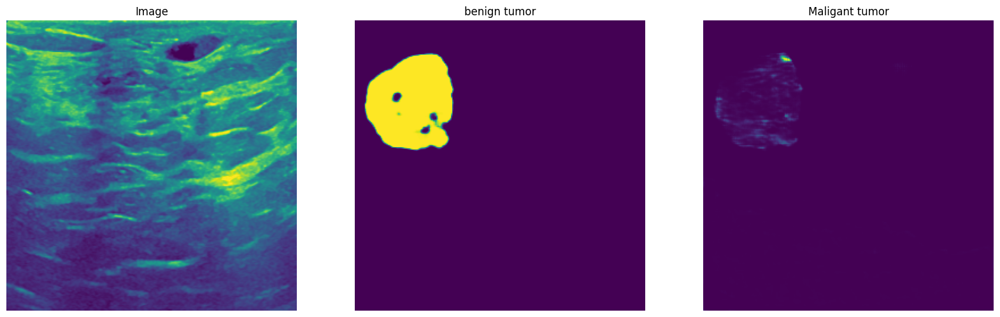

In [20]:
import matplotlib.pyplot as plt

index=np.random.choice(list(range(780)),10)
for i in index:
  indx=i
  img,msk=load_data(images[indx],masks[indx],labels[indx])
  print(np.min(img),np.max(img),img.shape)

  img2=preprocess(img)
  pred=model.predict(np.array([img2]))
  pred=pred[0]

  plt.figure(figsize=(20,20))
  plt.subplot(1,3,1)
  plt.axis('off')
  plt.imshow(img)
  plt.title("Image")

  plt.subplot(1,3,2)
  plt.axis('off')
  plt.imshow(pred[:,:,0])
  plt.title("benign tumor")

  plt.subplot(1,3,3)
  plt.axis('off')
  plt.imshow(pred[:,:,1])
  plt.title("Maligant tumor")
  plt.show()

In [25]:
from tensorflow.keras.models import load_model
import h5py

In [34]:
linknet_model_kaggle = load_model("Linknet_model.h5", compile=False)
# linknet_model_kaggle = load_model("Linknet_model.h5", custom_objects={"total_loss": total_loss})
# linknet_model_kaggle = load_model("Linknet_model.h5")

In [35]:
linknet_model_kaggle.compile("Adam", loss=total_loss, metrics=metrics)

/tmp/ipykernel_228267/3280900223.py:31: DeprecationWarning: Please use `zoom` from the `scipy.ndimage` namespace, the `scipy.ndimage.interpolation` namespace is deprecated.
  mask=scipy.ndimage.interpolation.zoom(mask,new_size)


0 255 (256, 256)


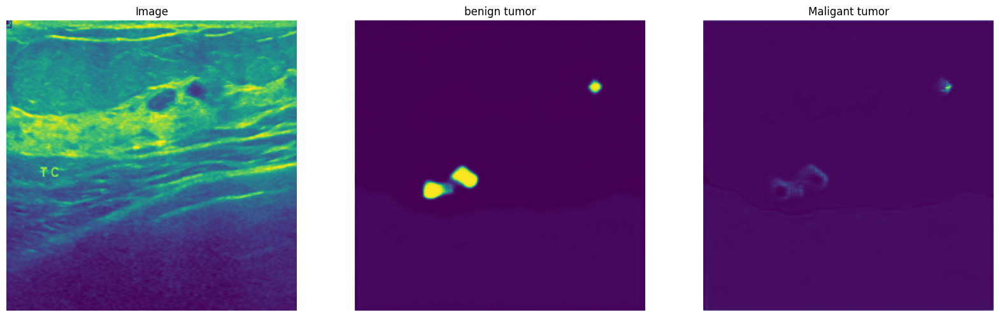

0 255 (256, 256)


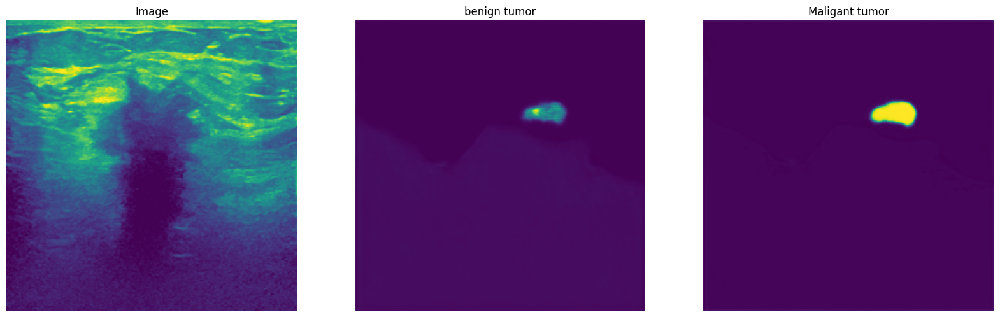

0 224 (256, 256)


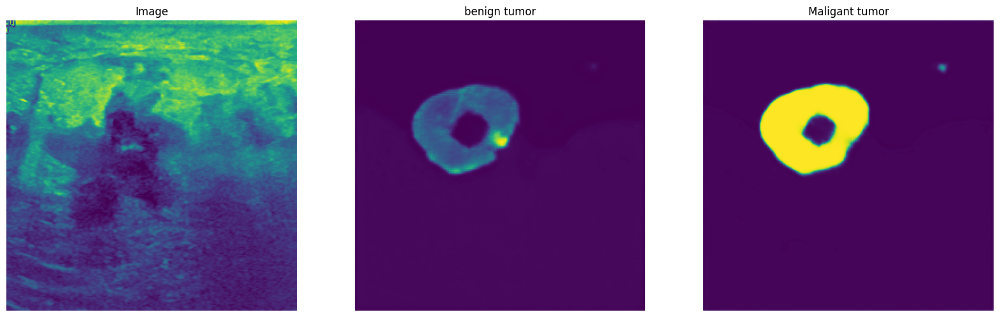

0 255 (256, 256)


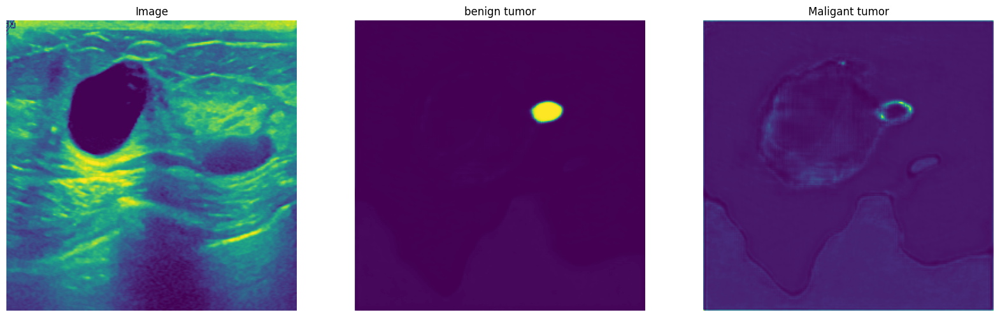

0 255 (256, 256)


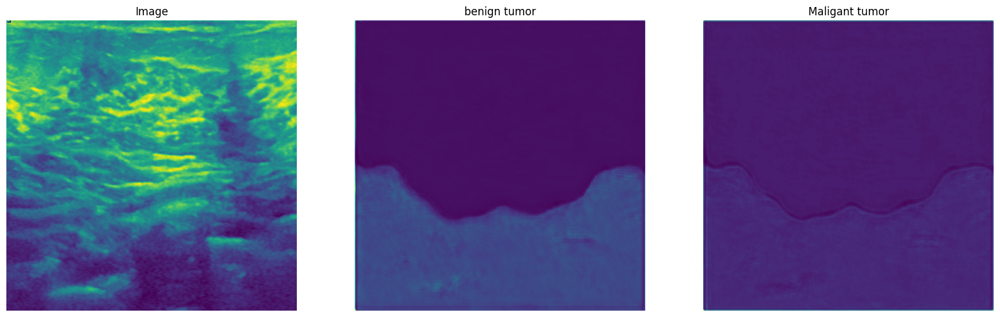

0 255 (256, 256)


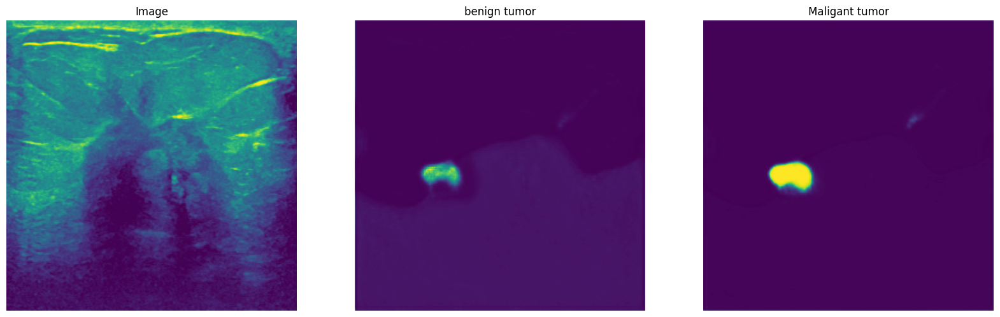

1 255 (256, 256)


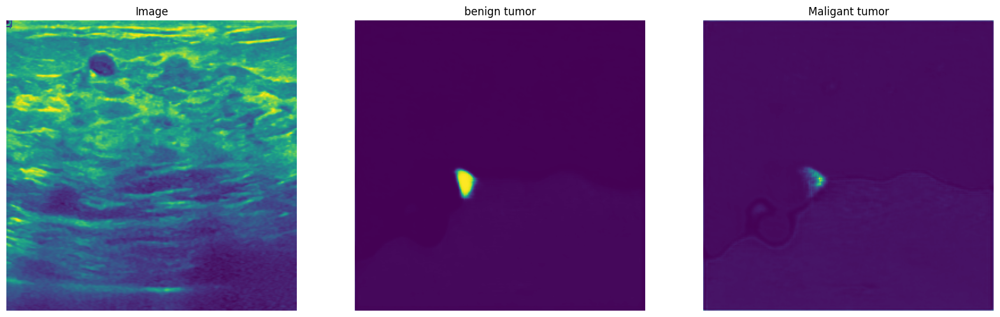

0 255 (256, 256)


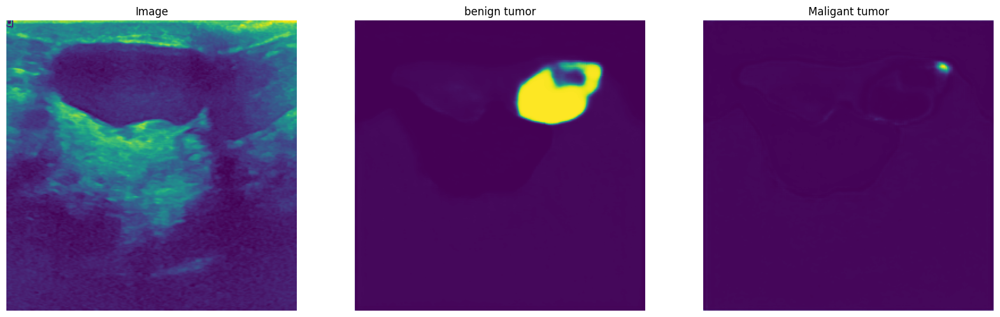

0 225 (256, 256)


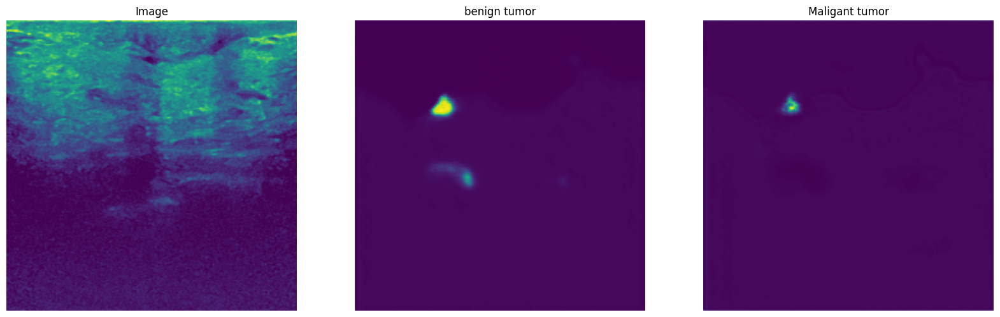

2 255 (256, 256)


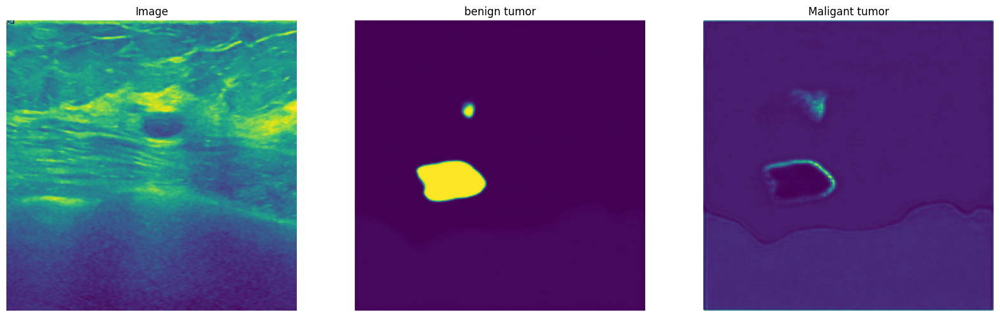

In [36]:
index=np.random.choice(list(range(780)),10)
for i in index:
  indx=i
  img,msk=load_data(images[indx],masks[indx],labels[indx])
  print(np.min(img),np.max(img),img.shape)

  img2=preprocess(img)
  pred=linknet_model_kaggle.predict(np.array([img2]))
  pred=pred[0]

  plt.figure(figsize=(20,20))
  plt.subplot(1,3,1)
  plt.axis('off')
  plt.imshow(img)
  plt.title("Image")

  plt.subplot(1,3,2)
  plt.axis('off')
  plt.imshow(pred[:,:,0])
  plt.title("benign tumor")

  plt.subplot(1,3,3)
  plt.axis('off')
  plt.imshow(pred[:,:,1])
  plt.title("Maligant tumor")
  plt.show()

LinkNet performing segmentation on breast cancer ultrasound images above. Then we see benign and malignant tumors.

- Light ones are false
- Dar ones are truth